In [4]:
import re
import math 
import numpy as np
import pandas as pd
from datetime import datetime, date
import matplotlib.pyplot as plt
import plotly 
import plotly.graph_objects as go 
import plotly.offline as pyo 
from plotly.offline import init_notebook_mode 
import plotly.express as px

In [7]:
df = pd.read_csv(r'C:\Users\Admin\GA\Capsotne_csv_files\gridwatch.csv',parse_dates=[' timestamp'])

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1020142 entries, 0 to 1020141
Data columns (total 23 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   id                 1020142 non-null  int64         
 1    timestamp         1020142 non-null  datetime64[ns]
 2    demand            1020142 non-null  int64         
 3    frequency         1020142 non-null  float64       
 4    coal              1020142 non-null  int64         
 5    nuclear           1020142 non-null  int64         
 6    ccgt              1020142 non-null  int64         
 7    wind              1020142 non-null  int64         
 8    pumped            1020142 non-null  int64         
 9    hydro             1020142 non-null  int64         
 10   biomass           1020142 non-null  int64         
 11   oil               1020142 non-null  int64         
 12   solar             1020142 non-null  float64       
 13   ocgt              1020142 

In [9]:
df.head()

,id,timestamp,demand,frequency,coal,nuclear,ccgt,wind,pumped,hydro,...,ocgt,french_ict,dutch_ict,irish_ict,ew_ict,nemo,other,north_south,scotland_england,ifa2
0,4,2011-05-27 15:50:04,38874,50.132000,9316,8221,18239,1253,309,636,...,0,912,0.0,-414,0.0,0,0,0,0,0
1,5,2011-05-27 15:55:02,38845,50.091000,9294,8225,18158,1304,332,633,...,0,912,0.0,-414,0.0,0,0,0,0,0
2,6,2011-05-27 16:00:02,38745,50.034000,9270,8224,18110,1322,285,634,...,0,912,0.0,-414,0.0,0,0,0,0,0
3,7,2011-05-27 16:05:01,38826,49.990002,9262,8220,18114,1364,287,635,...,0,900,0.0,-414,0.0,0,0,0,0,0
4,8,2011-05-27 16:10:02,38865,50.016998,9256,8210,18107,1370,297,637,...,0,900,0.0,-414,0.0,0,0,0,0,0


In [10]:
df.drop(columns=['id'],inplace=True)

In [11]:
df.rename(columns=lambda x: x.replace(' ',''),inplace=True)

In [12]:
df.set_index('timestamp',inplace=True)

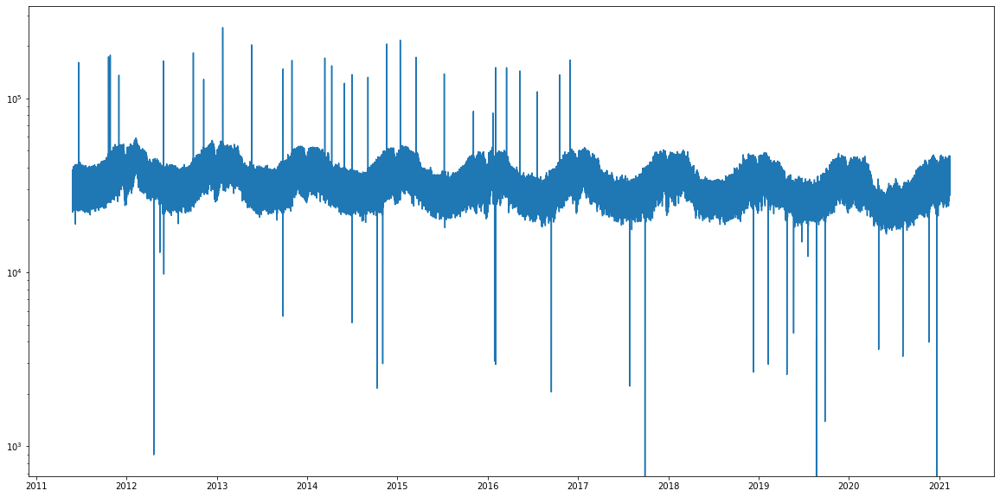

In [13]:
fig, ax = plt.subplots(figsize=(20,10))
ax = plt.plot(df['demand'],)
plt.yscale('log')
plt.show()

In [14]:
df.columns

Index(['demand', 'frequency', 'coal', 'nuclear', 'ccgt', 'wind', 'pumped',
       'hydro', 'biomass', 'oil', 'solar', 'ocgt', 'french_ict', 'dutch_ict',
       'irish_ict', 'ew_ict', 'nemo', 'other', 'north_south',
       'scotland_england', 'ifa2'],
      dtype='object')

<ipython-input-15-e82337e1a6d1>:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



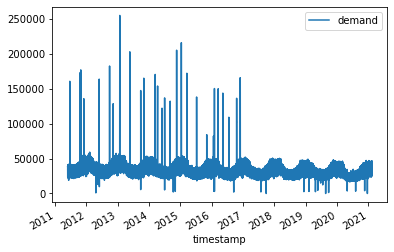

C:\Users\Admin\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



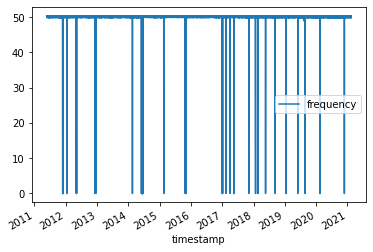

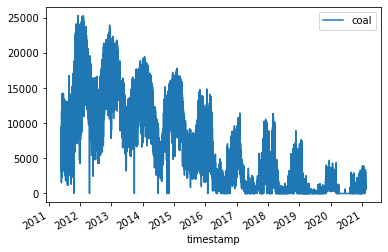

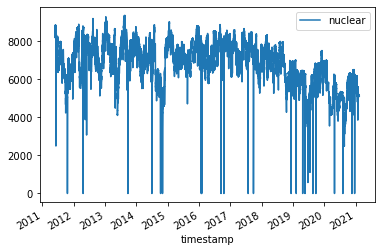

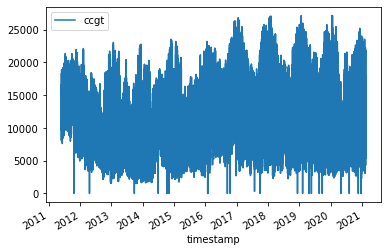

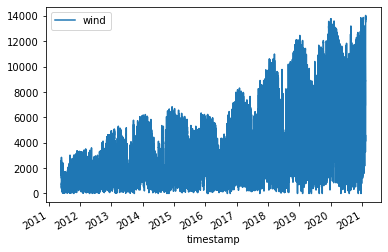

...

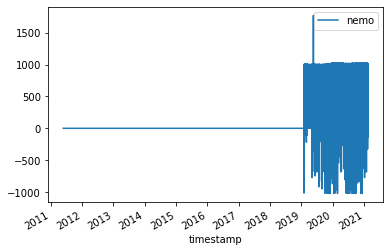

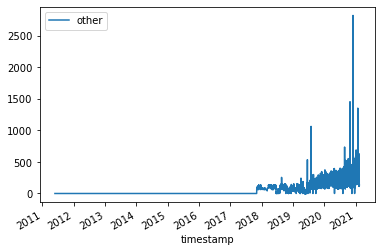

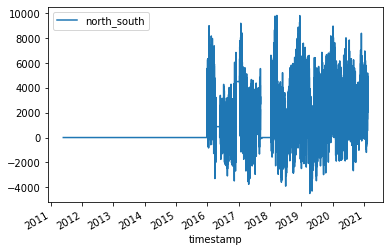

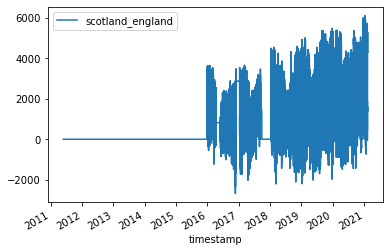

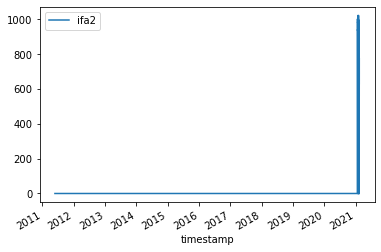

In [15]:
for col in df.columns:
    fig,ax = plt.subplots()
    ax=df[col].plot()
    plt.legend()

In [16]:
df.drop(columns=['frequency','solar','ew_ict'],inplace =True) # Solars just an estimate- possibly not accurate, ew_ict appears to be outlandish 

In [31]:
#PLotting trends 
for column in df.columns[1:9]:
    if column == 'coal':
        fig = go.Figure(data=go.Scatter(y=df[column].resample('w').mean().dropna(),x=df[column].resample('w').mean().dropna().index.date,name=column + ' Trend'))
    else:
        fig.add_trace(go.Scatter(y=df[column].resample('w').mean().dropna(),x=df[column].resample('w').mean().dropna().index.date,name=column + ' Trend'))
    
    fig.update_layout(title="Energy Source Trends",
                     yaxis_title="Supply (MW)",
                     xaxis_title="Date")
        
fig.show()

In [55]:
df.demand.resample('d').mean()

timestamp
2011-05-27    34138.163265
2011-05-28    30304.543554
2011-05-29    29053.767361
2011-05-30    31449.069686
2011-05-31    34366.334495
                  ...     
2021-02-09    37939.385417
2021-02-10    38203.993056
2021-02-11    38260.364583
2021-02-12    36820.184028
2021-02-13    31098.993902
Freq: D, Name: demand, Length: 3551, dtype: float64

In [83]:
demand = pd.DataFrame(df.demand.resample('h').mean()) 
demand.demand = demand.demand.apply(lambda x : float(x))
demand.fillna(method='ffill',inplace=True)
demand['Load_Status'] = demand.demand.apply(lambda x : 'Managable' if x < 45000 else 'Amber' if (x>45000) & (x<50000) else 'Red') 

In [84]:
demand.Load_Status.value_counts(normalize=True)

Managable    0.938039
Amber        0.050869
Red          0.011092
Name: Load_Status, dtype: float64

In [81]:
#Demand PLot 

fig = go.Figure(data=go.Scatter(y=demand.demand,
                                x=demand.demand.index.date,name='UK demand'))#meta=demand[demand.Load_Status == 'manageable'].index))

fig.add_trace(go.Scatter(y=[45000]*len(demand.demand),x=demand.demand.index.date,name='Manageable Limit'))
fig.add_trace(go.Scatter(y=[50000]*len(demand.demand),x=demand.demand.index.date,name='Amber Warning Limit'))
    
fig.update_layout(title="UK Energy Demand",
                     yaxis_title="Supply (MW)",
                     xaxis_title="Date")
        
fig.show()

In [86]:
demand.groupby('Load_Status').count()

,demand
Load_Status,
Amber,4334
Managable,79920
Red,945


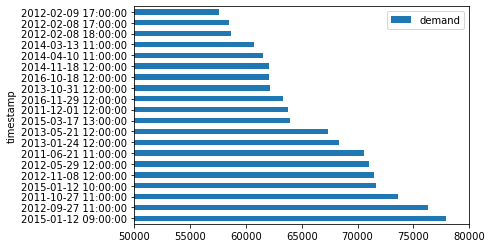

In [92]:
demand[demand.Load_Status=='Red'].sort_values(by='demand',ascending=False).iloc[:20].plot(kind='barh')
plt.xlim(50000,80000)
plt.show();

<AxesSubplot:xlabel='timestamp'>

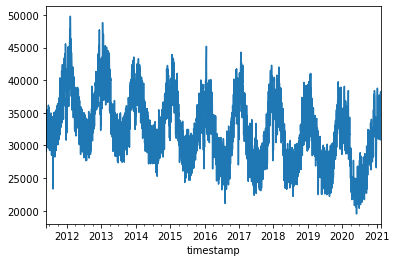

In [11]:
df.demand.resample('d').mean().plot()

<AxesSubplot:xlabel='timestamp'>

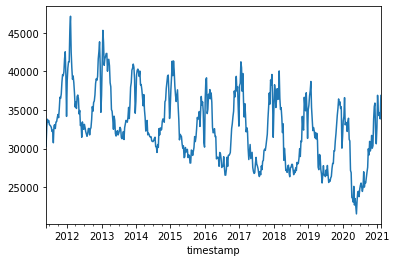

In [12]:
## Analysing the demand Time series:
df.demand.resample('w').mean().plot()

<AxesSubplot:xlabel='timestamp'>

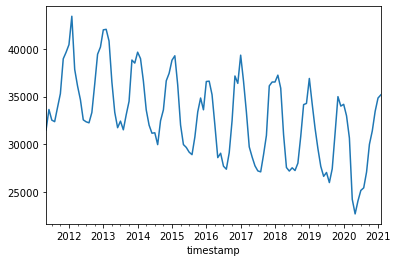

In [13]:
df.demand.resample('M').mean().plot()

In [15]:
df.columns

Index(['demand', 'frequency', 'coal', 'nuclear', 'ccgt', 'wind', 'pumped',
       'hydro', 'biomass', 'oil', 'solar', 'ocgt', 'french_ict', 'dutch_ict',
       'irish_ict', 'ew_ict', 'nemo', 'other', 'north_south',
       'scotland_england', 'ifa2'],
      dtype='object')

In [33]:
df['Total_domestic_supply'] = df.coal + df.nuclear + df.ccgt +df.wind +df.pumped +df.hydro + df.biomass +df.oil +df.solar + df.ocgt

In [14]:
non_domestic = list(df.columns)[12:]

In [17]:
non_domestic

['french_ict',
 'dutch_ict',
 'irish_ict',
 'ew_ict',
 'nemo',
 'other',
 'north_south',
 'scotland_england',
 'ifa2']

In [50]:
df['Non_Domestic_Demand_Flow'] = df.french_ict + df.dutch_ict + df.irish_ict + df.ew_ict + df.nemo

In [58]:
df.Total_domestic_supply[df.Total_domestic_supply==df.Total_domestic_supply.max()]

timestamp
2017-06-29 15:35:32    1451212.0
2017-06-29 15:40:33    1451212.0
Name: Total_domestic_supply, dtype: float64

In [59]:
# Fill outliers as mean value 


<AxesSubplot:>

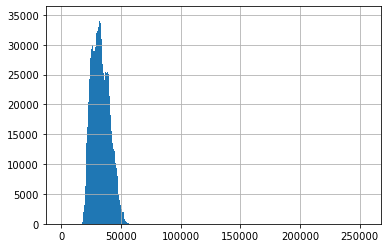

In [60]:
df.demand.hist(bins=400)

<AxesSubplot:xlabel='timestamp'>

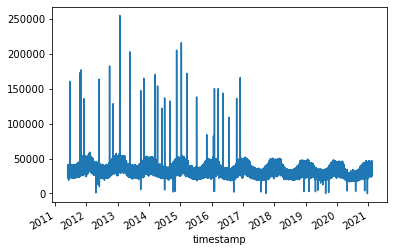

In [61]:
df.demand.plot()

In [62]:
df.Total_domestic_supply.max()/df.Total_domestic_supply.mean()

46.65928169124108

In [63]:
df.iloc[:,12:].columns

Index(['french_ict', 'dutch_ict', 'irish_ict', 'ew_ict', 'nemo', 'other',
       'north_south', 'scotland_england', 'ifa2', 'Non_Domestic_Demand_Flow',
       'Total_domestic_supply'],
      dtype='object')

In [64]:
def day_of_week(date):
    days_of_week = {0: 'monday', 1: 'tuesday', 2: 'wednesday',
                    3: 'thursday', 4: 'friday', 5: 'saturday', 6: 'sunday'}
    return days_of_week[date.weekday()]

In [65]:
df['Day_of_Week'] = df.index.map(lambda x: day_of_week(x))

In [66]:
df.Day_of_Week

timestamp
2011-05-27 15:50:04      friday
2011-05-27 15:55:02      friday
2011-05-27 16:00:02      friday
2011-05-27 16:05:01      friday
2011-05-27 16:10:02      friday
                         ...   
2021-02-13 13:15:41    saturday
2021-02-13 13:20:46    saturday
2021-02-13 13:25:41    saturday
2021-02-13 13:30:44    saturday
2021-02-13 13:35:41    saturday
Name: Day_of_Week, Length: 1020142, dtype: object

In [67]:
df.columns

Index(['demand', 'frequency', 'coal', 'nuclear', 'ccgt', 'wind', 'pumped',
       'hydro', 'biomass', 'oil', 'solar', 'ocgt', 'french_ict', 'dutch_ict',
       'irish_ict', 'ew_ict', 'nemo', 'other', 'north_south',
       'scotland_england', 'ifa2', 'Non_Domestic_Demand_Flow',
       'Total_domestic_supply', 'Day_of_Week'],
      dtype='object')

In [68]:
day_of_week_means = df.groupby('Day_of_Week').mean().iloc[:,0]
day_of_week_means

Day_of_Week
friday       33721.256686
monday       33709.835421
saturday     30256.971296
sunday       29567.783823
thursday     34420.222876
tuesday      34395.593637
wednesday    34471.206363
Name: demand, dtype: float64

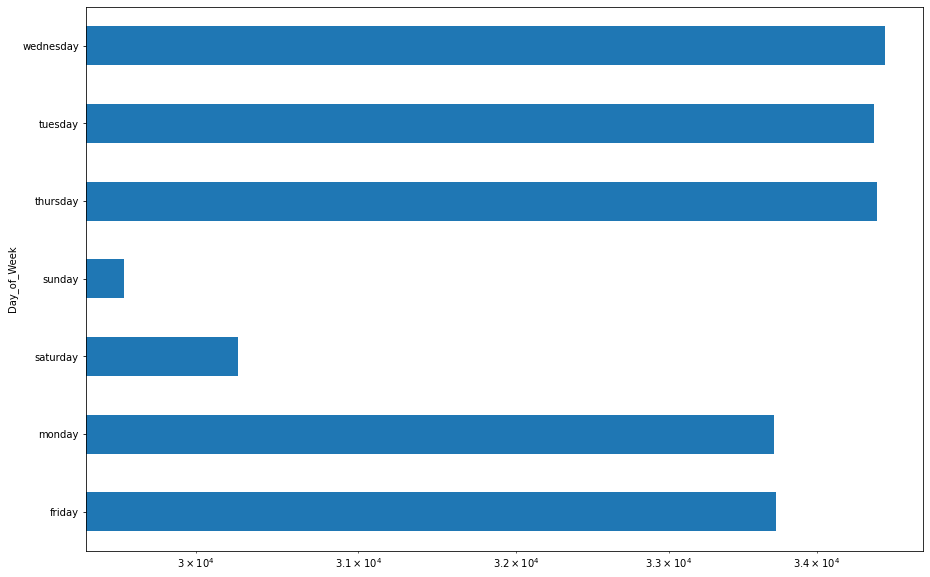

In [69]:
fig,ax =plt.subplots(nrows=1,figsize=(15,10))
ax = day_of_week_means.plot(kind='barh')
plt.xscale('log')
plt.show()


In [70]:
bank_holidays =['1-1','2-4','5-4','3-5','31-5','30-8','27-12','28-12']

In [71]:
df['day'] = df.index.day
df['Month'] = df.index.month 
df['Year'] = df.index.year

In [72]:
df.day.value_counts(normalize=True)

7     0.033021
10    0.033012
4     0.033010
1     0.033008
11    0.033008
6     0.033006
5     0.032993
28    0.032986
9     0.032961
3     0.032954
2     0.032908
12    0.032862
27    0.032833
8     0.032808
15    0.032732
14    0.032720
18    0.032719
16    0.032717
17    0.032712
19    0.032693
20    0.032691
26    0.032684
25    0.032674
24    0.032671
13    0.032657
23    0.032647
21    0.032558
22    0.032541
29    0.031296
30    0.030450
31    0.019469
Name: day, dtype: float64

In [73]:
df.Month.value_counts(normalize=True)

10    0.087463
8     0.087412
12    0.087220
1     0.087190
7     0.087148
6     0.084599
11    0.084387
9     0.084366
5     0.079969
3     0.078688
4     0.076130
2     0.075428
Name: Month, dtype: float64

In [74]:
df['Bank_Holiday'] = df.index.map(lambda x: f'{x.day}-{x.month}'  if f'{x.day}-{x.month}' in bank_holidays else 0 ) 

In [75]:
df[df.Bank_Holiday != 0].shape

(22169, 28)

In [76]:
8/364

0.02197802197802198

In [77]:
(df[df.Bank_Holiday != 0].shape[0]/df.shape[0])*100

2.1731288389263455

In [78]:
df.iloc[:,0]

timestamp
2011-05-27 15:50:04    38874
2011-05-27 15:55:02    38845
2011-05-27 16:00:02    38745
2011-05-27 16:05:01    38826
2011-05-27 16:10:02    38865
                       ...  
2021-02-13 13:15:41    35764
2021-02-13 13:20:46    35787
2021-02-13 13:25:41    35763
2021-02-13 13:30:44    35791
2021-02-13 13:35:41    35783
Name: demand, Length: 1020142, dtype: int64

In [79]:
from datetime import date

import holidays

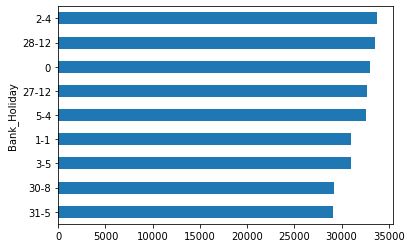

In [80]:
df.groupby('Bank_Holiday').mean().sort_values(by='demand',ascending=True).iloc[:,0].plot(kind='barh');

In [81]:
uk_hols = holidays.CountryHoliday('UK',years=[2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021])

In [82]:
uk_hols_dates = list(uk_hols.keys())

In [83]:
df['UK_hols'] = df.index.map(lambda x: uk_hols[x] if x in uk_hols_dates else 0 )

In [84]:
df[df.UK_hols != 0].shape

(40009, 29)

In [85]:
df[df.Bank_Holiday != 0].shape

(22169, 29)

In [86]:
df.drop(columns=['Bank_Holiday'],inplace=True)

In [88]:
df.columns

Index(['demand', 'frequency', 'coal', 'nuclear', 'ccgt', 'wind', 'pumped',
       'hydro', 'biomass', 'oil', 'solar', 'ocgt', 'french_ict', 'dutch_ict',
       'irish_ict', 'ew_ict', 'nemo', 'other', 'north_south',
       'scotland_england', 'ifa2', 'Non_Domestic_Demand_Flow',
       'Total_domestic_supply', 'Day_of_Week', 'day', 'Month', 'Year',
       'UK_hols'],
      dtype='object')

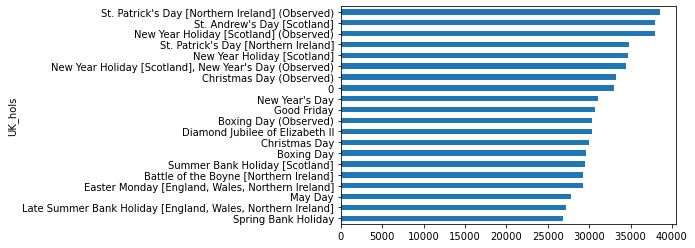

In [90]:
df.groupby('UK_hols').mean().sort_values(by='demand',ascending=True).iloc[:,0].plot(kind='barh');

In [91]:
df_weekly = df.resample('w').mean()
df_daily = df.resample('d').mean()
df_hourly = df.resample('h').mean()

In [92]:
df.columns

Index(['demand', 'frequency', 'coal', 'nuclear', 'ccgt', 'wind', 'pumped',
       'hydro', 'biomass', 'oil', 'solar', 'ocgt', 'french_ict', 'dutch_ict',
       'irish_ict', 'ew_ict', 'nemo', 'other', 'north_south',
       'scotland_england', 'ifa2', 'Non_Domestic_Demand_Flow',
       'Total_domestic_supply', 'Day_of_Week', 'day', 'Month', 'Year',
       'UK_hols'],
      dtype='object')

In [93]:
import csv 
df.to_csv('Demand_clean')